In [102]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import cv2
from PIL import Image
import seaborn as sns
import os, shutil, glob, gc 
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import applications, layers, Model
from tensorflow.keras.utils import plot_model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import backend as K
from keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.model_selection import KFold

In [103]:
from tensorflow.keras.models import load_model
embedding_model = load_model('/kaggle/input/model07margin/kaggle/working/output/model.h5', compile=False)
embedding_model.load_weights('/kaggle/input/model07margin/kaggle/working/output/weight.h5')

In [104]:
def load_image(image_path, img_size=(224,224)):
    img = plt.imread(image_path)
    img = np.array(Image.fromarray(img).resize(img_size, resample=Image.BILINEAR))
    return img / 255.0

def load_images(filepaths, img_size=(224,224)):
    images = [load_image(fp, img_size=img_size) for fp in filepaths]  # Pass img_size parameter here
    return np.stack(images)

def get_all_embeddings_batched(filepaths, model, batch_size=32):
    num_images = len(filepaths)
    all_embeddings = []

    for start_idx in range(0, num_images, batch_size):
        end_idx = start_idx + batch_size
        batch_filepaths = filepaths[start_idx:end_idx]
        batch_images = load_images(batch_filepaths)
        batch_embeddings = model.predict(batch_images, verbose=0)
        all_embeddings.extend(batch_embeddings)

    return np.array(all_embeddings)

# Few shot with unseen dataset 1 shot 8 ways

**1 image for each class and there are 8 classes**

![im](https://miro.medium.com/v2/resize:fit:720/format:webp/1*EXvo_Sk6Q-9g4DD-AYj91g.png)

In [105]:
support_filepaths = [path for path in glob.glob('/kaggle/input/datasetv2/query/**/*.jpg', recursive = True)]#just i named support as query in my dataset
print(f"Total support images: {len(support_filepaths)}")

query_filepaths = [path for path in glob.glob('/kaggle/input/datasetv2/unseen/**/*.jpg', recursive = True)]
print(f"Total query images: {len(query_filepaths)}")

Total support images: 8
Total query images: 2897


In [106]:
support_embeddings = get_all_embeddings_batched(support_filepaths, embedding_model)
query_embeddings = get_all_embeddings_batched(query_filepaths, embedding_model)

In [107]:
df_query = pd.DataFrame(query_filepaths, columns=['filepath'])

In [108]:
def extract_image_id(row):
    filepath = row['filepath']
    img_class = os.path.basename(os.path.dirname(filepath)).split('.')[-1]
    return img_class

df_query['True_DogID'] = df_query.apply(extract_image_id, axis=1)

In [109]:
df_query

,filepath,True_DogID
0,/kaggle/input/datasetv2/unseen/2257003/WIN_202...,2257003
1,/kaggle/input/datasetv2/unseen/2257003/WIN_202...,2257003
2,/kaggle/input/datasetv2/unseen/2257003/WIN_202...,2257003
3,/kaggle/input/datasetv2/unseen/2257003/WIN_202...,2257003
4,/kaggle/input/datasetv2/unseen/2257003/WIN_202...,2257003
...,...,...
2892,/kaggle/input/datasetv2/unseen/3321002/WIN_202...,3321002
2893,/kaggle/input/datasetv2/unseen/3321002/WIN_202...,3321002
2894,/kaggle/input/datasetv2/unseen/3321002/WIN_202...,3321002
2895,/kaggle/input/datasetv2/unseen/3321002/WIN_202...,3321002


In [110]:
from sklearn.metrics.pairwise import cosine_similarity

In [111]:
def make_predictions(support_embeddings, query_embeddings, support_filepaths, df_query):
    similarities = cosine_similarity(query_embeddings, support_embeddings)
    support_labels = [filepath.split(".")[0].split("/")[-1] for filepath in support_filepaths]
    predicted_labels = [support_labels[np.argmax(similarities[i])] for i in range(similarities.shape[0])]
    df_query['predicted'] = predicted_labels

    return df_query

df_query = make_predictions(support_embeddings, query_embeddings, support_filepaths, df_query)


In [112]:
df_query

,filepath,True_DogID,predicted
0,/kaggle/input/datasetv2/unseen/2257003/WIN_202...,2257003,2257003
1,/kaggle/input/datasetv2/unseen/2257003/WIN_202...,2257003,2257003
2,/kaggle/input/datasetv2/unseen/2257003/WIN_202...,2257003,2257004
3,/kaggle/input/datasetv2/unseen/2257003/WIN_202...,2257003,2257003
4,/kaggle/input/datasetv2/unseen/2257003/WIN_202...,2257003,2257003
...,...,...,...
2892,/kaggle/input/datasetv2/unseen/3321002/WIN_202...,3321002,3321001
2893,/kaggle/input/datasetv2/unseen/3321002/WIN_202...,3321002,3321001
2894,/kaggle/input/datasetv2/unseen/3321002/WIN_202...,3321002,3321002
2895,/kaggle/input/datasetv2/unseen/3321002/WIN_202...,3321002,3321001


In [113]:
from sklearn.metrics import accuracy_score, f1_score

ground_truth = df_query['True_DogID'].tolist()
predictions = df_query['predicted'].tolist()

accuracy = accuracy_score(ground_truth, predictions)
f1 = f1_score(ground_truth, predictions, average='weighted')

print(f"Accuracy: {accuracy:.2f}")
print(f"F1 Score: {f1:.2f}")


Accuracy: 0.62
F1 Score: 0.62


# choose by highest similarity

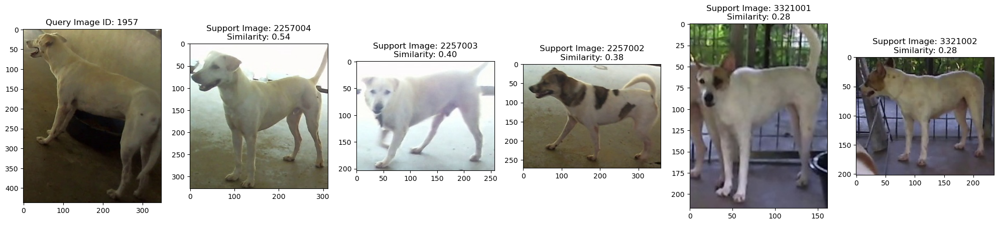

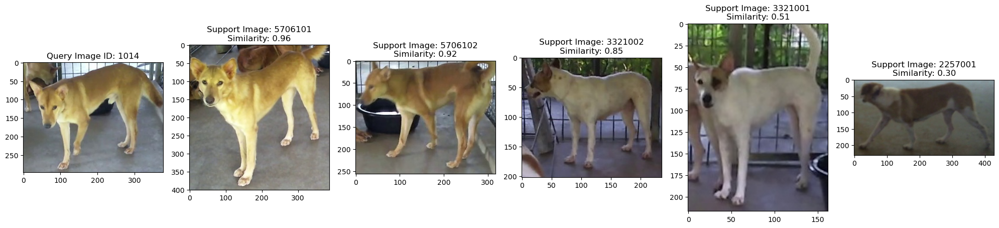

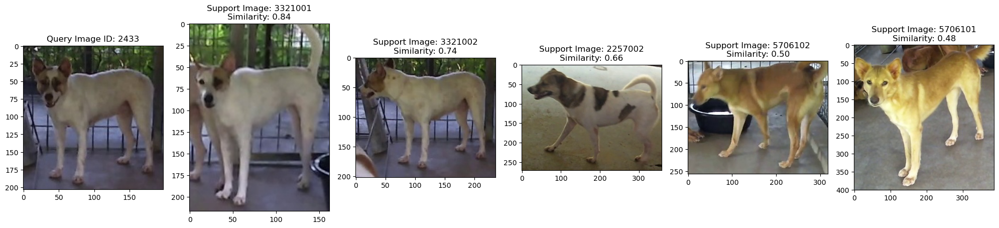

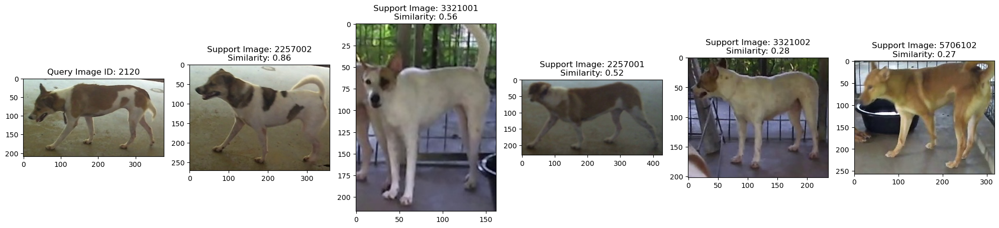

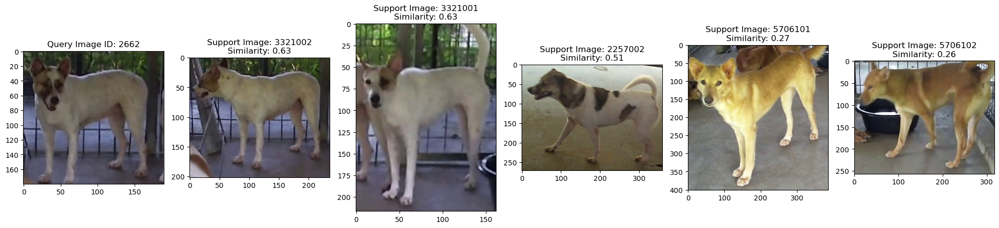

In [114]:
import matplotlib.pyplot as plt
import os

def visualize_predictions(df_query, support_filepaths, query_embeddings, support_embeddings, num_samples=5):
    num_supports = len(support_filepaths)
    random_samples = df_query.sample(num_samples)

    # Get the labels from the support filepaths
    support_labels = [os.path.basename(filepath).split(".")[0] for filepath in support_filepaths]

    for idx, row in random_samples.iterrows():
        query_image_path = row['filepath']
        query_image = plt.imread(query_image_path)
        
        # Calculate similarities between the query image and all support images
        similarities = cosine_similarity([query_embeddings[idx]], support_embeddings)[0]
        
        # Get the indices that would sort the similarities array in descending order
        sorted_indices = np.argsort(similarities)[::-1]
        
        # Create a subplot for the query image and top 5 similar support images
        fig, axs = plt.subplots(1, 6, figsize=(20, 20))
        
        axs[0].imshow(query_image)
        axs[0].set_title(f'Query Image ID: {idx+1}')
        
        for j in range(5):
            support_image_path = support_filepaths[sorted_indices[j]]
            support_image = plt.imread(support_image_path)
            
            # Use the label in the title
            axs[j+1].imshow(support_image)
            axs[j+1].set_title(f'Support Image: {support_labels[sorted_indices[j]]}\nSimilarity: {similarities[sorted_indices[j]]:.2f}')
        
        plt.tight_layout()
        plt.show()

# Call the function
visualize_predictions(df_query, support_filepaths, query_embeddings, support_embeddings)


# # Few shot with unseen dataset 3 shot 8 ways

In [115]:
import os
import shutil
import random

def create_query_folder(input_path, query_path, num_samples):
    dirs = [name for name in os.listdir(input_path) if os.path.isdir(os.path.join(input_path, name))]
    if not os.path.exists(query_path):
        os.makedirs(query_path)
    for dir in dirs:
        files = os.listdir(os.path.join(input_path, dir))
        sampled_files = random.sample(files, num_samples)
        if not os.path.exists(os.path.join(query_path, dir)):
            os.makedirs(os.path.join(query_path, dir))
        else:
            for file in os.listdir(os.path.join(query_path, dir)):
                os.remove(os.path.join(query_path, dir, file))
        for file in sampled_files:
            shutil.copy(os.path.join(input_path, dir, file), os.path.join(query_path, dir, file))
            
create_query_folder("/kaggle/input/datasetv2/unseen/", "support3/",num_samples=3)


In [116]:
path_list_query = [path for path in glob.glob('/kaggle/input/datasetv2/unseen/**/*.jpg', recursive=True)]
print(f"Total query images: {len(path_list_query)}")

# Create a dataframe for the unseen images
df_query = pd.DataFrame(path_list_query, columns=['filepath'])

# Get the file paths of all support images
path_list_support = [path for path in glob.glob('/kaggle/working/support3/**/*.jpg', recursive=True)]
print(f"Total support images: {len(path_list_support)}")

Total query images: 2897
Total support images: 24


In [117]:
support_embeddings = get_all_embeddings_batched(path_list_support, embedding_model) 

In [118]:
def extract_image_id(row):
    filepath = row['filepath']
    img_class = os.path.basename(os.path.dirname(filepath)).split('.')[-1]
    return img_class

df_query['True_DogID'] = df_query.apply(extract_image_id, axis=1)

In [119]:
df_query

,filepath,True_DogID
0,/kaggle/input/datasetv2/unseen/2257003/WIN_202...,2257003
1,/kaggle/input/datasetv2/unseen/2257003/WIN_202...,2257003
2,/kaggle/input/datasetv2/unseen/2257003/WIN_202...,2257003
3,/kaggle/input/datasetv2/unseen/2257003/WIN_202...,2257003
4,/kaggle/input/datasetv2/unseen/2257003/WIN_202...,2257003
...,...,...
2892,/kaggle/input/datasetv2/unseen/3321002/WIN_202...,3321002
2893,/kaggle/input/datasetv2/unseen/3321002/WIN_202...,3321002
2894,/kaggle/input/datasetv2/unseen/3321002/WIN_202...,3321002
2895,/kaggle/input/datasetv2/unseen/3321002/WIN_202...,3321002


In [120]:
similarities = cosine_similarity(query_embeddings, support_embeddings)

support_labels = [os.path.dirname(filepath).split("/")[-1] for filepath in path_list_support] # Get the folder name as label

top3_indices = np.argsort(similarities, axis=1)[:, -3:]

predicted = []

for indices in top3_indices:
    top3_labels = [support_labels[i] for i in indices]
    majority_vote = max(set(top3_labels), key = top3_labels.count)
    predicted.append(majority_vote)

# Add the predicted labels to the test dataframe
df_query['predicted'] = predicted


In [121]:
df_query

,filepath,True_DogID,predicted
0,/kaggle/input/datasetv2/unseen/2257003/WIN_202...,2257003,2257003
1,/kaggle/input/datasetv2/unseen/2257003/WIN_202...,2257003,2257003
2,/kaggle/input/datasetv2/unseen/2257003/WIN_202...,2257003,2257003
3,/kaggle/input/datasetv2/unseen/2257003/WIN_202...,2257003,2257003
4,/kaggle/input/datasetv2/unseen/2257003/WIN_202...,2257003,2257003
...,...,...,...
2892,/kaggle/input/datasetv2/unseen/3321002/WIN_202...,3321002,3321001
2893,/kaggle/input/datasetv2/unseen/3321002/WIN_202...,3321002,3321002
2894,/kaggle/input/datasetv2/unseen/3321002/WIN_202...,3321002,3321002
2895,/kaggle/input/datasetv2/unseen/3321002/WIN_202...,3321002,3321002


In [122]:
from sklearn.metrics import accuracy_score, f1_score

ground_truth = df_query['True_DogID'].tolist()
predictions = df_query['predicted'].tolist()

accuracy = accuracy_score(ground_truth, predictions)
f1 = f1_score(ground_truth, predictions, average='weighted')

print(f"Accuracy: {accuracy:.2f}")
print(f"F1 Score: {f1:.2f}")


Accuracy: 0.80
F1 Score: 0.81


In [123]:
import matplotlib.pyplot as plt

def visualize_predictions(df_query, path_list_support, query_embeddings, support_embeddings, num_samples, num_shots):
    num_supports = len(path_list_support)
    random_samples = df_query.sample(num_samples)
    
    support_labels = [os.path.dirname(filepath).split("/")[-1] for filepath in path_list_support]

    for idx, row in random_samples.iterrows():
        query_image_path = row['filepath']
        query_image = plt.imread(query_image_path)
        
        # Calculate similarities between the query image and all support images
        similarities = cosine_similarity([query_embeddings[idx]], support_embeddings)[0]
        
        # Get the indices that would sort the similarities array in descending order
        sorted_indices = np.argsort(similarities)[::-1]
        
        # Get labels of top num_shots most similar supports
        topN_labels = [support_labels[i] for i in sorted_indices[:num_shots]]
        majority_vote = max(set(topN_labels), key=topN_labels.count)
        
        # Create a subplot for the query image and top num_shots similar support images
        fig, axs = plt.subplots(1, num_shots + 1, figsize=(20, 20))
        
        axs[0].imshow(query_image)
        axs[0].set_title(f'Query Image ID: {idx+1}\nPredicted: {majority_vote}')
        
        for j in range(num_shots):
            support_image_path = path_list_support[sorted_indices[j]]
            support_image = plt.imread(support_image_path)
            
            axs[j+1].imshow(support_image)
            axs[j+1].set_title(f'Support Image: {support_labels[sorted_indices[j]]}\nSimilarity: {similarities[sorted_indices[j]]:.2f}')
        
        plt.tight_layout()
        plt.show()


# choose by vote from top 3 similarity

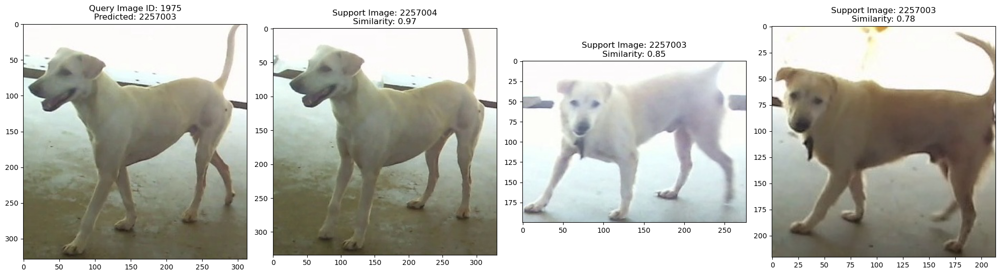

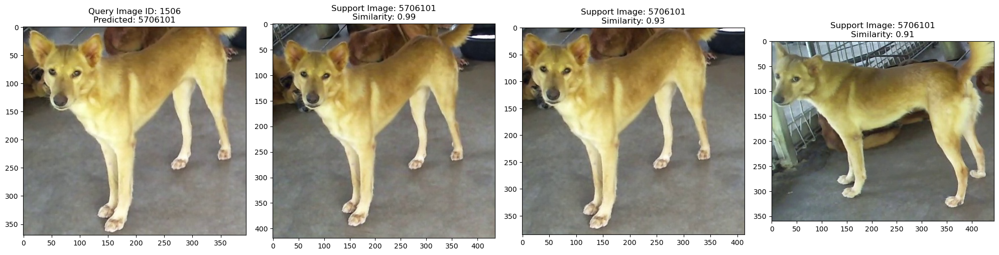

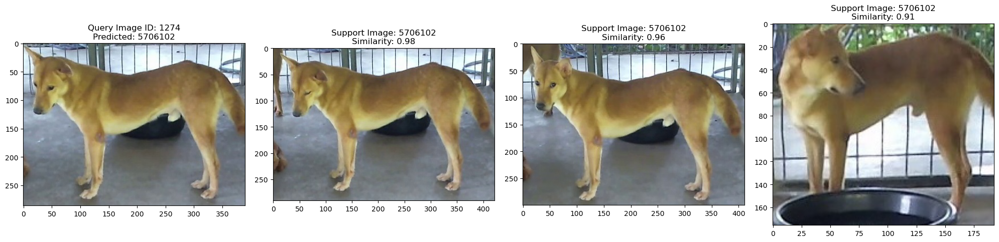

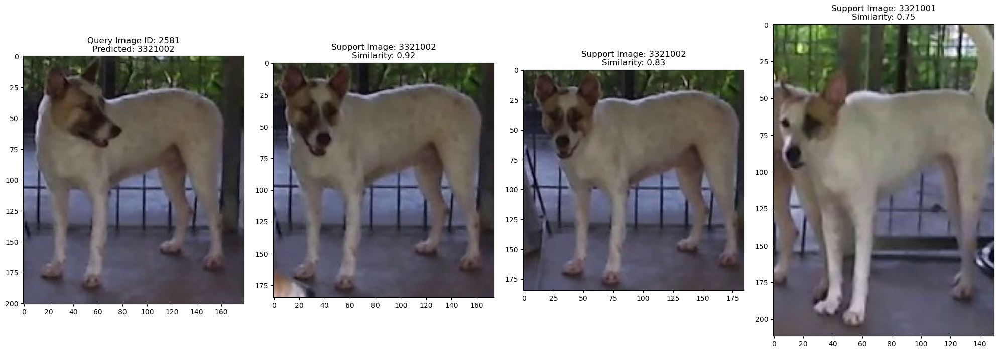

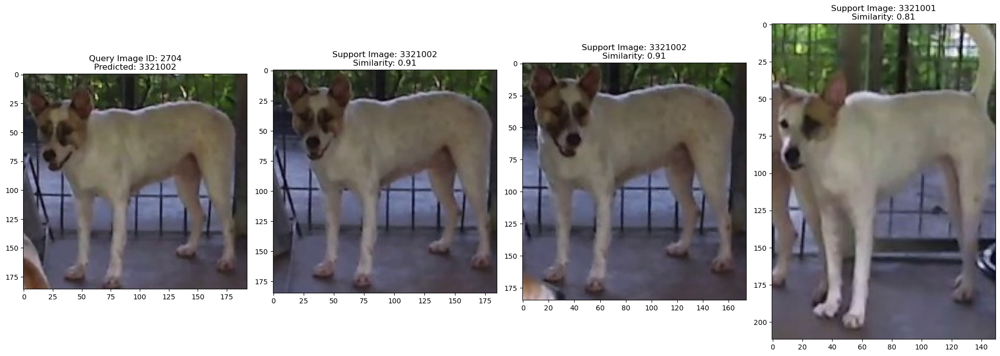

In [124]:
visualize_predictions(df_query, path_list_support, query_embeddings, support_embeddings, num_samples=5, num_shots=3)

# # Few shot with unseen dataset 5 shot 8 ways

In [134]:
create_query_folder("/kaggle/input/datasetv2/unseen/", "support5/",num_samples=5)

In [135]:
path_list_query = [path for path in glob.glob('/kaggle/input/datasetv2/unseen/**/*.jpg', recursive=True)]
print(f"Total query images: {len(path_list_query)}")

# Create a dataframe for the unseen images
df_query = pd.DataFrame(path_list_query, columns=['filepath'])

# Get the file paths of all support images
path_list_support = [path for path in glob.glob('/kaggle/working/support5/**/*.jpg', recursive=True)]
print(f"Total support images: {len(path_list_support)}")

Total query images: 2897
Total support images: 40


In [136]:
support_embeddings = get_all_embeddings_batched(path_list_support, embedding_model) 

In [137]:
def extract_image_id(row):
    filepath = row['filepath']
    img_class = os.path.basename(os.path.dirname(filepath)).split('.')[-1]
    return img_class

df_query['True_DogID'] = df_query.apply(extract_image_id, axis=1)

In [138]:
df_query

,filepath,True_DogID
0,/kaggle/input/datasetv2/unseen/2257003/WIN_202...,2257003
1,/kaggle/input/datasetv2/unseen/2257003/WIN_202...,2257003
2,/kaggle/input/datasetv2/unseen/2257003/WIN_202...,2257003
3,/kaggle/input/datasetv2/unseen/2257003/WIN_202...,2257003
4,/kaggle/input/datasetv2/unseen/2257003/WIN_202...,2257003
...,...,...
2892,/kaggle/input/datasetv2/unseen/3321002/WIN_202...,3321002
2893,/kaggle/input/datasetv2/unseen/3321002/WIN_202...,3321002
2894,/kaggle/input/datasetv2/unseen/3321002/WIN_202...,3321002
2895,/kaggle/input/datasetv2/unseen/3321002/WIN_202...,3321002


In [139]:
similarities = cosine_similarity(query_embeddings, support_embeddings)

support_labels = [os.path.dirname(filepath).split("/")[-1] for filepath in path_list_support] # Get the folder name as label

top5_indices = np.argsort(similarities, axis=1)[:, -5:]

predicted = []

for indices in top5_indices:
    top5_labels = [support_labels[i] for i in indices]
    majority_vote = max(set(top5_labels), key = top5_labels.count)
    predicted.append(majority_vote)

# Add the predicted labels to the test dataframe
df_query['predicted'] = predicted


In [140]:
df_query

,filepath,True_DogID,predicted
0,/kaggle/input/datasetv2/unseen/2257003/WIN_202...,2257003,2257003
1,/kaggle/input/datasetv2/unseen/2257003/WIN_202...,2257003,2257003
2,/kaggle/input/datasetv2/unseen/2257003/WIN_202...,2257003,2257003
3,/kaggle/input/datasetv2/unseen/2257003/WIN_202...,2257003,2257003
4,/kaggle/input/datasetv2/unseen/2257003/WIN_202...,2257003,2257003
...,...,...,...
2892,/kaggle/input/datasetv2/unseen/3321002/WIN_202...,3321002,2257001
2893,/kaggle/input/datasetv2/unseen/3321002/WIN_202...,3321002,3321002
2894,/kaggle/input/datasetv2/unseen/3321002/WIN_202...,3321002,3321002
2895,/kaggle/input/datasetv2/unseen/3321002/WIN_202...,3321002,3321002


In [141]:
from sklearn.metrics import accuracy_score, f1_score

ground_truth = df_query['True_DogID'].tolist()
predictions = df_query['predicted'].tolist()

accuracy = accuracy_score(ground_truth, predictions)
f1 = f1_score(ground_truth, predictions, average='weighted')

print(f"Accuracy: {accuracy:.2f}")
print(f"F1 Score: {f1:.2f}")


Accuracy: 0.86
F1 Score: 0.86


# choose by vote from top 5 similarity

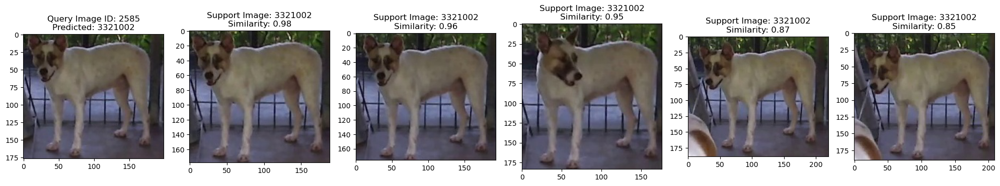

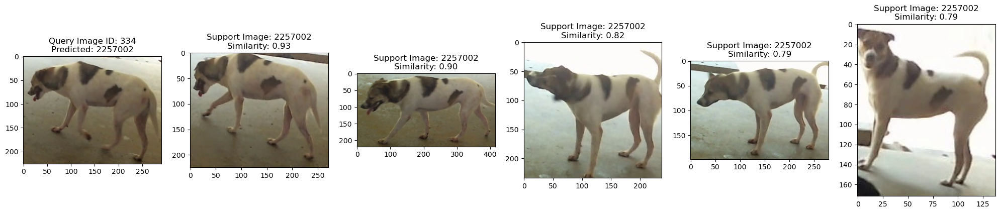

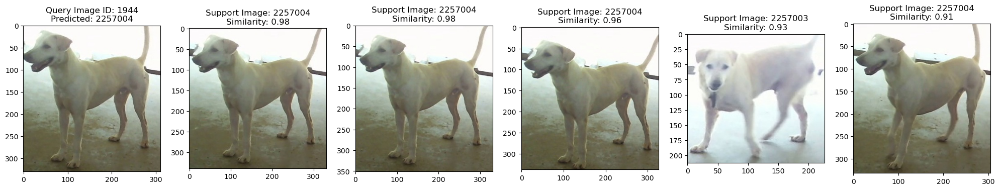

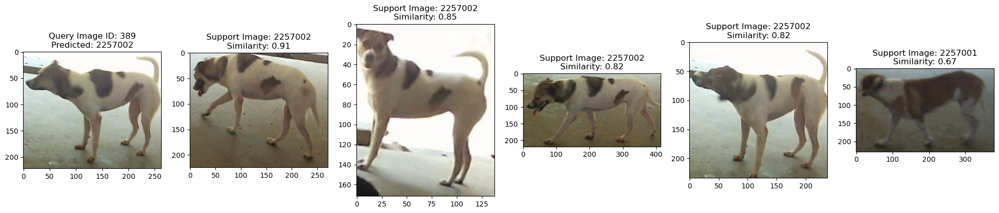

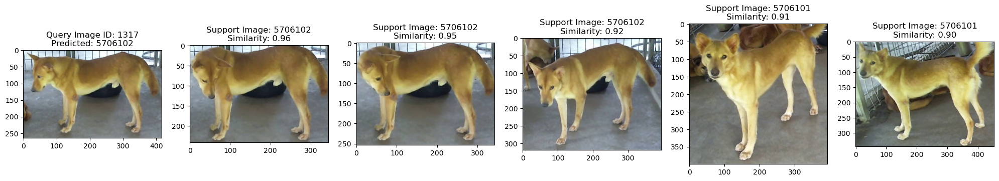

In [142]:
visualize_predictions(df_query, path_list_support, query_embeddings, support_embeddings, num_samples=5, num_shots=5)